In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly as ly
import seaborn as sns
import plotly.express as px

In [2]:
#Leitura de "spotify_artists.csv" para um data frame e tratamento dos dados exclusivamente para análise exploratória
df_artists = pd.read_csv('spotify_artists.csv', index_col=0)

#Remoção de colunas com informações irrelevantes ou redundantes
df_artists.drop(columns=["type"], inplace=True)

#Renomeação de colunas para melhor entendimento e cruzameto de informação com os demais .csv
df_artists.rename(columns={"name": "Nome do artista", 
                          "id": "ID do artista",
                          "artist_popularity": "Popularidade do artista",
                          "followers": "Seguidores",
                          "genres": "Gêneros por artista",
                          "track_id": "ID da faixa",
                          "track_name_prev": "track_name_prev (artists)"}, inplace=True)

#Criação de coluna "Número de gêneros" e caracterização de artistas sem gêneros definidos como outliers, já que há perda de rótulo para a análise.
df_artists["Gêneros por artista"] = df_artists["Gêneros por artista"].apply(lambda x: x[1:-1].replace("\'", "").split(", "))
df_artists["Número de gêneros por artista"] = df_artists["Gêneros por artista"].apply(lambda x: len(x) if x != [""] else 0)

#Mudança na ordem das colunas para melhor visualização.
df_artists = df_artists[["Nome do artista",
                         "Popularidade do artista",
                         "Seguidores",
                         "Gêneros por artista",
                         "Número de gêneros por artista",
                         "track_name_prev (artists)",
                         "ID do artista",
                         "ID da faixa"]]

#Checagem de duplicatas a partir de características exclusivas aos artistas.
df_artists.drop_duplicates(["Nome do artista", "ID do artista"], inplace=True)
df_artists["Nome do artista"].value_counts()
df_artists["ID da faixa"].value_counts()

#Mudança de dtype para otimização
df_artists["ID do artista"] = df_artists["ID do artista"].astype("category")
df_artists["ID da faixa"] = df_artists["ID da faixa"].astype("category")


df_artists.info()
df_artists.head()

<class 'pandas.core.frame.DataFrame'>
Index: 56129 entries, 0 to 56128
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   Nome do artista                56128 non-null  object  
 1   Popularidade do artista        56129 non-null  int64   
 2   Seguidores                     56129 non-null  int64   
 3   Gêneros por artista            56129 non-null  object  
 4   Número de gêneros por artista  56129 non-null  int64   
 5   track_name_prev (artists)      56129 non-null  object  
 6   ID do artista                  56129 non-null  category
 7   ID da faixa                    56129 non-null  category
dtypes: category(2), int64(3), object(3)
memory usage: 7.2+ MB


,Nome do artista,Popularidade do artista,Seguidores,Gêneros por artista,Número de gêneros por artista,track_name_prev (artists),ID do artista,ID da faixa
0,Juliano Cezar,44,23230,"[sertanejo, sertanejo pop, sertanejo tradicion...",4,track_9,4mGnpjhqgx4RUdsIJiURdo,0wmDmAILuW9e2aRttkl4aC
1,The Grenadines,22,313,[],0,track_30,1dLnVku4VQUOLswwDFvRc9,4wqwj0gA8qPZKLl5WVqXml
2,Gangway,26,1596,[danish pop rock],1,track_38,6YVY310fjfUzKi8hiqR7iK,1bFqWDbvHmZe2f4Nf9qaD8
3,FADES,31,149,[uk alternative pop],1,track_34,2VElyouiCfoYPDJluzwJwK,3MFSUBAidPzRBbIS7BDj1S
4,Jean-Pierre Guignon,21,11,[french baroque],1,track_26,4agVy03qW8juSysCTUOuDI,2r3q57FhxdsCyYr0kuDq4b


In [3]:
#Leitura de "spotify_albums.csv" para um data frame e tratamento dos dados exclusivamente para análise exploratória.
df_albums = pd.read_csv('spotify_albums.csv', index_col=0)

#Remoção de colunas com informações irrelevantes, redundantes ou que seriam interessantes apenas com web scrapping.
df_albums.drop(columns=["type", "images", "release_date_precision", "external_urls"], inplace=True)

#Renomeação de colunas para melhor entendimento e cruzameto de informação com os demais .csv.
df_albums.rename(columns={"album_type": "Tipo do álbum", 
                          "available_markets": "Mercados disponíveis (albums)", 
                          "name": "Nome do álbum", 
                          "release_date": "Data de lançamento", 
                          "total_tracks": "Número de faixas", 
                          "artist_id": "ID do artista",
                          "id": "ID do álbum",
                          "track_id": "ID da faixa",
                          "href": "href (albums)",
                          "uri": "uri (albums)",
                          "track_name_prev": "track_name_prev (albums)"}, inplace=True)

#Criação de coluna "Número de mercados disponíveis".
df_albums["Mercados disponíveis (albums)"] = df_albums["Mercados disponíveis (albums)"].apply(lambda x: x[1:-1].replace("\'", "").split(", "))
df_albums["Número de mercados disponíveis (albums)"] = df_albums["Mercados disponíveis (albums)"].apply(lambda x: len(x) if x != [""] else 0)

#Criação de coluna somente com ano de lançamento.
df_albums["Ano de lançamento"] = df_albums["Data de lançamento"].apply(lambda x: int(x[:4]))


#Mudança na ordem das colunas para melhor visualização.
df_albums = df_albums[["Nome do álbum", 
                       "Tipo do álbum", 
                       "Data de lançamento",
                       "Ano de lançamento",
                       "Número de faixas", 
                       "Mercados disponíveis (albums)",
                       "Número de mercados disponíveis (albums)",
                       "href (albums)",
                       "uri (albums)",
                       "track_name_prev (albums)",
                       "ID do álbum",
                       "ID do artista",
                       "ID da faixa"]]

#Checagem de duplicatas a partir de características exclusivas aos álbuns.
df_albums.drop_duplicates(["ID do álbum", "Nome do álbum"], inplace=True)
df_albums["Nome do álbum"].value_counts()
df_albums["ID do artista"].value_counts()
df_albums["ID da faixa"].value_counts()
#No data frame de álbuns, há muitos álbuns com nomes genéricos, com destaque para "Spotify Singles", "Greatets Hits" e Spotify Sessions".
#Logo, a checagem de duplicatas será feita somente a partir do ID dos álbuns.
#Muitos álbuns e músicas são "Various Artists Songs", estando sob um mesmo ID de artista. Por outro lado, as músicas têm IDs únicos.

#Mudança de dtype para otimização
df_albums["ID do álbum"] = df_albums["ID do álbum"].astype("category")
df_albums["ID do artista"] = df_albums["ID do artista"].astype("category")
df_albums["ID da faixa"] = df_albums["ID da faixa"].astype("category")


df_albums.info()
df_albums.head()

<class 'pandas.core.frame.DataFrame'>
Index: 75511 entries, 0 to 75510
Data columns (total 13 columns):
 #   Column                                   Non-Null Count  Dtype   
---  ------                                   --------------  -----   
 0   Nome do álbum                            75511 non-null  object  
 1   Tipo do álbum                            75511 non-null  object  
 2   Data de lançamento                       75511 non-null  object  
 3   Ano de lançamento                        75511 non-null  int64   
 4   Número de faixas                         75511 non-null  int64   
 5   Mercados disponíveis (albums)            75511 non-null  object  
 6   Número de mercados disponíveis (albums)  75511 non-null  int64   
 7   href (albums)                            75511 non-null  object  
 8   uri (albums)                             75511 non-null  object  
 9   track_name_prev (albums)                 75511 non-null  object  
 10  ID do álbum                            

,Nome do álbum,Tipo do álbum,Data de lançamento,Ano de lançamento,Número de faixas,Mercados disponíveis (albums),Número de mercados disponíveis (albums),href (albums),uri (albums),track_name_prev (albums),ID do álbum,ID do artista,ID da faixa
0,If I Ain't Got You EP,single,2019-02-08,2019,6,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,https://api.spotify.com/v1/albums/1gAM7M4rBwEb...,spotify:album:1gAM7M4rBwEbSPeAQR2nx1,track_32,1gAM7M4rBwEbSPeAQR2nx1,3DiDSECUqqY1AuBP8qtaIa,2iejTMy9XZ8Gaae0aQ2yl0
1,Shostakovich Symphony No.5 - Four Romances on ...,album,2019-03-01,2019,8,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,https://api.spotify.com/v1/albums/4KfJZV7WfolY...,spotify:album:4KfJZV7WfolYlxBzOTo66s,track_11,4KfJZV7WfolYlxBzOTo66s,6s1pCNXcbdtQJlsnM1hRIA,1WQfghEjszJJ4H8MAWrQ2C
2,Take My Bass,single,2019-03-14,2019,1,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,https://api.spotify.com/v1/albums/7nLYY7uAVUb5...,spotify:album:7nLYY7uAVUb57kpd7tZxnS,track_15,7nLYY7uAVUb57kpd7tZxnS,5YjfNaHq05WrwldRe1QSBc,3jJKj4QTK3v18ZSwpk7AcV
3,Hypnotizing (Are U),single,2016-11-16,2016,1,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,https://api.spotify.com/v1/albums/6p20Rt4x2Qn5...,spotify:album:6p20Rt4x2Qn5mUMRi1s6pj,track_46,6p20Rt4x2Qn5mUMRi1s6pj,2G9Vc16JCpnZmK4uGH46Fa,1xGtDafUZbHyYC3Xarcbrj
4,Sunshine,single,2018-07-20,2018,1,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,https://api.spotify.com/v1/albums/1XeoOqC1q7U2...,spotify:album:1XeoOqC1q7U2iyLEQJ64cu,track_10,1XeoOqC1q7U2iyLEQJ64cu,2dwM9OcE4c3Ph1UBINSodx,0gWtsXvXOzAT6FtM3ur8in


In [4]:
#Leitura de "spotify_tracks.csv" para um data frame e tratamento dos dados exclusivamente para análise exploratória.
df_tracks = pd.read_csv('spotify_tracks.csv', index_col=0)

#Remoção de colunas com informações irrelevantes, redundantes ou que seriam interessantes apenas com web scrapping.
df_tracks.drop(columns=["type", "lyrics", "analysis_url", "preview_url"], inplace=True)

#Renomeação de colunas para melhor entendimento e cruzameto de informação com os demais .csv.
df_tracks.rename(columns={"name": "Nome da faixa",
                          "popularity": "Popularidade da faixa",
                          "country" : "País",
                          "duration_ms": "Duração da faixa (s)",
                          "available_markets": "Mercados disponíveis (tracks)",
                          "track_number": "Número da faixa",
                          "disc_number": "Número do disco",
                          "album_id": "ID do álbum",
                          "id": "ID da faixa (tracks)",
                          "artists_id": "ID do artista (tracks)",
                          "acousticness": "Acusticidade",
                          "danceability": "Dançabilidade",
                          "energy": "Energia",
                          "instrumentalness": "Instrumentalidade",
                          "key": "Tom",
                          "liveness": "Vivacidade",
                          "loudness": "Intensidade",
                          "mode": "Modo",
                          "speechiness": "Vocal",
                          "tempo": "Pulsação (BPM)",
                          "time_signature": "Ritmo",
                          "valence": "Comovência",
                          "playlist": "Playlist",
                          "track_name_prev": "track_name_prev (tracks)",
                          "uri": "uri (tracks)",
                          "href": "href (tracks)"}, inplace=True)

#Criação de coluna "Número de mercados disponíveis".
df_tracks["Mercados disponíveis (tracks)"] = df_tracks["Mercados disponíveis (tracks)"].apply(lambda x: x[1:-1].replace("\'", "").split(", "))
df_tracks["Número de mercados disponíveis (tracks)"] = df_tracks["Mercados disponíveis (tracks)"].apply(lambda x: len(x) if x != [""] else 0)

#Mudança na coluna de duração para melhor visualização dos dados.
df_tracks["Duração da faixa (s)"] = df_tracks["Duração da faixa (s)"]/1000

#Mudança da formatação da informação em "ID do artista (tracks)".
df_tracks["ID do artista (tracks)"] = df_tracks["ID do artista (tracks)"].apply(lambda x: x[1:-1].replace("\'", ""))

#Mudança na ordem das colunas para melhor visualização.
df_tracks = df_tracks[["Nome da faixa",
                       "País",
                       "Playlist",
                       "Número do disco",
                       "Número da faixa",
                       "Popularidade da faixa",
                       "Mercados disponíveis (tracks)",
                       "Número de mercados disponíveis (tracks)",
                       "Duração da faixa (s)",
                       "Acusticidade",
                       "Dançabilidade",
                       "Energia",
                       "Instrumentalidade",
                       "Tom",
                       "Vivacidade",
                       "Intensidade",
                       "Modo",
                       "Vocal",
                       "Pulsação (BPM)",
                       "Ritmo",
                       "Comovência",
                       "href (tracks)",
                       "uri (tracks)",
                       "track_name_prev (tracks)",
                       "ID do álbum",
                       "ID do artista (tracks)",
                       "ID da faixa (tracks)"]]

#Checagem de duplicatas a partir de características exclusivas às faixas.
df_tracks.drop_duplicates(["ID da faixa (tracks)", "Nome da faixa"], inplace=True)
df_tracks["Nome da faixa"].value_counts()
df_tracks["ID do artista (tracks)"].value_counts()
df_tracks["ID do álbum"].value_counts()

#Mudança de dtype para otimização
df_tracks["ID do álbum"] = df_tracks["ID do álbum"].astype("category")
df_tracks["ID do artista (tracks)"] = df_tracks["ID do artista (tracks)"].astype("category")
df_tracks["ID da faixa (tracks)"] = df_tracks["ID da faixa (tracks)"].astype("category")


df_tracks.info()
df_tracks.head()

<class 'pandas.core.frame.DataFrame'>
Index: 101939 entries, 0 to 101938
Data columns (total 27 columns):
 #   Column                                   Non-Null Count   Dtype   
---  ------                                   --------------   -----   
 0   Nome da faixa                            101939 non-null  object  
 1   País                                     101939 non-null  object  
 2   Playlist                                 101939 non-null  object  
 3   Número do disco                          101939 non-null  float64 
 4   Número da faixa                          101939 non-null  float64 
 5   Popularidade da faixa                    101939 non-null  float64 
 6   Mercados disponíveis (tracks)            101939 non-null  object  
 7   Número de mercados disponíveis (tracks)  101939 non-null  int64   
 8   Duração da faixa (s)                     101939 non-null  float64 
 9   Acusticidade                             101939 non-null  float64 
 10  Dançabilidade            

,Nome da faixa,País,Playlist,Número do disco,Número da faixa,Popularidade da faixa,Mercados disponíveis (tracks),Número de mercados disponíveis (tracks),Duração da faixa (s),Acusticidade,...,Vocal,Pulsação (BPM),Ritmo,Comovência,href (tracks),uri (tracks),track_name_prev (tracks),ID do álbum,ID do artista (tracks),ID da faixa (tracks)
0,Blood,BE,Hipsteribrunssi,1.0,1.0,28.0,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,235.584,0.294,...,0.0262,115.018,4.0,0.6220,https://api.spotify.com/v1/tracks/5qljLQuKnNJf...,spotify:track:5qljLQuKnNJf4F4vfxQB0V,track_14,0D3QufeCudpQANOR7luqdr,3mxJuHRn2ZWD5OofvJtDZY,5qljLQuKnNJf4F4vfxQB0V
1,The Ugly Duckling,BE,Animal Stories,1.0,3.0,31.0,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,656.960,0.863,...,0.9220,115.075,3.0,0.5890,https://api.spotify.com/v1/tracks/3VAX2MJdmdqA...,spotify:track:3VAX2MJdmdqARLSU5hPMpm,track_3,1bcqsH5UyTBzmh9YizdsBE,4xWMewm6CYMstu0sPgd9jJ,3VAX2MJdmdqARLSU5hPMpm
2,Jimmy Launches His Own Range Of Greetings Cards,BE,Best Of British Comedy,1.0,4.0,31.0,[GB],1,492.840,0.750,...,0.9440,79.565,4.0,0.0850,https://api.spotify.com/v1/tracks/1L3YAhsEMrGV...,spotify:track:1L3YAhsEMrGVvCgDXj2TYn,track_4,4tKijjmxGClg4JOLAyo2qE,3hYaK5FF3YAglCj5HZgBnP,1L3YAhsEMrGVvCgDXj2TYn
3,The Crime At Pickets Mill,BE,Short Stories,1.0,1.0,14.0,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,316.578,0.763,...,0.9380,112.822,3.0,0.5330,https://api.spotify.com/v1/tracks/6aCe9zzoZmCo...,spotify:track:6aCe9zzoZmCojX7bbgKKtf,track_9,6FeJF5r8roonnKraJxr4oB,2KQsUB9DRBcJk17JWX1eXD,6aCe9zzoZmCojX7bbgKKtf
4,Setup + Punchline = Joke,BE,Best Of British Comedy,1.0,2.0,32.0,[GB],1,558.880,0.770,...,0.9430,81.260,4.0,0.0906,https://api.spotify.com/v1/tracks/1Vo802A38tPF...,spotify:track:1Vo802A38tPFHmje1h91um,track_2,4tKijjmxGClg4JOLAyo2qE,3hYaK5FF3YAglCj5HZgBnP,1Vo802A38tPFHmje1h91um


Resumindo o tratamento individual das bases, é necessário destacar os seguintes pontos:

- Colunas "type" foram dropadas por mostrarem uma informação redundante ao ver da equipe.
- Colunas criadas, como "Número de gêneros" e "Número de mercados disponíveis", em razão da análise de correlação. As colunas "Gênero", "Mercados disponíveis" e "Nome"(s) servirão para rotularmos a conclusão de nossa análise.
- Colunas de ID tiveram seu dtype mudado em razão de categorização da informação e melhor casamento de informação durante o merge.
- Checagem de duplicatas feita a partir das colunas Nome e ID representativos de cada data frame para alinhar com o tipo principal da informação trabalhada respectivamente. 

OBS: ainda há um artista sem nome.

In [5]:
#Merge dos data frames de artistas e álbuns em base completa, sem valores nulos (how="inner").
df_artists.sort_values("ID do artista", inplace=True)
df_albums.sort_values("ID do artista", inplace=True)
df_artists_albums = pd.merge(df_artists, df_albums, on="ID do artista", how="inner")


#Confecção do data frame de artistas sem álbuns.
df_artists_noalbums = pd.merge(df_artists, df_albums, on="ID do artista", how="left")
df_artists_noalbums = df_artists_noalbums[df_artists_noalbums.isna().any(axis=1)]
df_artists_noalbums.reset_index(drop=True, inplace=True)

#Confecção do data frame de álbuns sem artistas.
df_noartists_albums = pd.merge(df_artists, df_albums, on="ID do artista", how="right")
df_noartists_albums = df_noartists_albums[df_noartists_albums.isna().any(axis=1)]
df_noartists_albums.reset_index(drop=True, inplace=True)

#Concatenação dos data frames de artistas sem álbuns.
df_artists_albums_nulls = pd.concat([df_noartists_albums, df_artists_noalbums], axis=0)
df_artists_albums_nulls.reset_index(drop=True, inplace=True)
df_artists_albums_nulls.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18048 entries, 0 to 18047
Data columns (total 20 columns):
 #   Column                                   Non-Null Count  Dtype   
---  ------                                   --------------  -----   
 0   Nome do artista                          17527 non-null  object  
 1   Popularidade do artista                  17528 non-null  float64 
 2   Seguidores                               17528 non-null  float64 
 3   Gêneros por artista                      17528 non-null  object  
 4   Número de gêneros por artista            17528 non-null  float64 
 5   track_name_prev (artists)                17528 non-null  object  
 6   ID do artista                            18048 non-null  object  
 7   ID da faixa_x                            17528 non-null  category
 8   Nome do álbum                            520 non-null    object  
 9   Tipo do álbum                            520 non-null    object  
 10  Data de lançamento                

Após manipulação do merge e tentativa e erro, afirma-se que há 520 álbuns sem artistas associados e 17528 artistas sem álbuns associados.
No momento, não é prioritário que as informações nulas sejam preenchidas, mas, para uma análise mais completa, provavelmente será necessário fazer web scrapping. Será possível acessar os artistas ausentes através de web scrapping com uma string str("https://open.spotify.com/artist" + *df_albums["ID do artista"]*), o que também poderá ser feito com *df_artists["ID do artista"]* para acessar o perfil de artistas que não têm álbuns associados e, então, buscar as informações dos álbuns disponíveis.

In [6]:
#Merge dos data frames de artistas com álbuns e faixas em base completa, sem valores nulos (how="inner").
df_artists_albums.sort_values("ID do álbum", inplace=True)
df_tracks.sort_values("ID do álbum", inplace=True)
df_all_inners = pd.merge(df_artists_albums, df_tracks, on="ID do álbum", how="inner")
df_all_inners.drop(columns=["ID da faixa_x", "Mercados disponíveis (tracks)", "Número de mercados disponíveis (tracks)"])
df_all_inners.reset_index(drop=True, inplace=True)


#Confecção do data frame de artistas com álbuns sem faixas.
df_artistsalbums_notracks = pd.merge(df_artists_albums, df_tracks, on="ID do álbum", how="left")
df_artistsalbums_notracks = df_artistsalbums_notracks[df_artistsalbums_notracks.isna().any(axis=1)]
df_artistsalbums_notracks.reset_index(drop=True, inplace=True)

#Confecção do data frame de artistas sem álbuns.
df_noartistsalbums_tracks = pd.merge(df_artists_albums, df_tracks, on="ID do álbum", how="right")
df_noartistsalbums_tracks = df_noartistsalbums_tracks[df_noartistsalbums_tracks.isna().any(axis=1)]
df_noartistsalbums_tracks.reset_index(drop=True, inplace=True)

#Concatenação dos data frames de artistas sem álbuns.
df_artistsalbums_tracks_nulls = pd.concat([df_artistsalbums_notracks, df_noartistsalbums_tracks], axis=0)
df_artistsalbums_tracks_nulls.reset_index(drop=True, inplace=True)
df_all_inners

,Nome do artista,Popularidade do artista,Seguidores,Gêneros por artista,Número de gêneros por artista,track_name_prev (artists),ID do artista,ID da faixa_x,Nome do álbum,Tipo do álbum,...,Modo,Vocal,Pulsação (BPM),Ritmo,Comovência,href (tracks),uri (tracks),track_name_prev (tracks),ID do artista (tracks),ID da faixa (tracks)
0,Rob,25,39,[],0,track_36,0ABl0JElqGIJeuB5fqBfz0,13iDvBj1LFmwolgYXNjtTw,"Make It Fast, Make It Slow (Soundway Records)",album,...,0.0,0.4230,103.967,4.0,0.416,https://api.spotify.com/v1/tracks/4hu0hZxoEAgG...,spotify:track:4hu0hZxoEAgGnf1wgpEax8,track_43,0ABl0JElqGIJeuB5fqBfz0,4hu0hZxoEAgGnf1wgpEax8
1,Rob,25,39,[],0,track_36,0ABl0JElqGIJeuB5fqBfz0,13iDvBj1LFmwolgYXNjtTw,"Make It Fast, Make It Slow (Soundway Records)",album,...,0.0,0.3210,94.063,4.0,0.309,https://api.spotify.com/v1/tracks/13iDvBj1LFmw...,spotify:track:13iDvBj1LFmwolgYXNjtTw,track_31,0ABl0JElqGIJeuB5fqBfz0,13iDvBj1LFmwolgYXNjtTw
2,Rocío Jurado,48,144694,[pop romantico],1,track_21,1FlYevYLENR3IMgMlnMvf9,47WTpJKUjZ4hxNECGMAVhS,Señora,album,...,0.0,0.5380,191.335,3.0,0.690,https://api.spotify.com/v1/tracks/47WTpJKUjZ4h...,spotify:track:47WTpJKUjZ4hxNECGMAVhS,track_28,1FlYevYLENR3IMgMlnMvf9,47WTpJKUjZ4hxNECGMAVhS
3,Ra. D,40,10185,"[k-hop, k-indie, korean pop]",3,track_28,6zPbaYJp7itQ8p0gPLqf2S,01O8Tc4EKWDNJPMmNrzttw,pingpong,single,...,1.0,0.3890,183.296,3.0,0.588,https://api.spotify.com/v1/tracks/01O8Tc4EKWDN...,spotify:track:01O8Tc4EKWDNJPMmNrzttw,track_20,"6zPbaYJp7itQ8p0gPLqf2S, 1HcvbeotsNC0wdvJNr35rN",01O8Tc4EKWDNJPMmNrzttw
4,Various Artists,0,433940,[],0,track_43,0LyfQWJT6nXafLPZqxe9Of,3SXzn6hrZA9d22GmFB6Vvr,Avenida Brasil - EP,single,...,1.0,0.1680,130.061,4.0,0.921,https://api.spotify.com/v1/tracks/2SdUz3PRDjLN...,spotify:track:2SdUz3PRDjLNWpERZwUmnF,track_10,"5pEUmuVL8wg3Tw3LNcENTi, 6vA4znwvrwhCSYfcrkC2Hg",2SdUz3PRDjLNWpERZwUmnF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101139,Badflite,33,1925,[],0,track_54,3AEEmo3VYEBbQBUUEY2fUS,03mkbTQ3unUjfu09aUS22t,High Love,single,...,1.0,0.0430,97.136,4.0,0.173,https://api.spotify.com/v1/tracks/03mkbTQ3unUj...,spotify:track:03mkbTQ3unUjfu09aUS22t,track_36,"3AEEmo3VYEBbQBUUEY2fUS, 5yhR0OqJhkbQ2y76XUte3R",03mkbTQ3unUjfu09aUS22t
101140,CLMD,56,14710,"[big room, norwegian pop, tropical house]",3,track_164,7LiVklVR1325BIOqD9kykr,5uUYvFI7K1p8xrxIHEEAii,Phases (Deluxe),album,...,1.0,0.0323,120.016,4.0,0.365,https://api.spotify.com/v1/tracks/5uUYvFI7K1p8...,spotify:track:5uUYvFI7K1p8xrxIHEEAii,track_95,"7LiVklVR1325BIOqD9kykr, 4Q8IIlsZsXY1BgPzaz4DYq",5uUYvFI7K1p8xrxIHEEAii
101141,CLMD,56,14710,"[big room, norwegian pop, tropical house]",3,track_164,7LiVklVR1325BIOqD9kykr,5uUYvFI7K1p8xrxIHEEAii,Phases (Deluxe),album,...,1.0,0.0522,119.983,4.0,0.396,https://api.spotify.com/v1/tracks/6DJyCDd3HMa3...,spotify:track:6DJyCDd3HMa3Ue9uTZtRkl,track_18,"7LiVklVR1325BIOqD9kykr, 3AVfmawzu83sp94QW7CEGm",6DJyCDd3HMa3Ue9uTZtRkl
101142,CLMD,56,14710,"[big room, norwegian pop, tropical house]",3,track_164,7LiVklVR1325BIOqD9kykr,5uUYvFI7K1p8xrxIHEEAii,Phases (Deluxe),album,...,0.0,0.0386,128.021,4.0,0.454,https://api.spotify.com/v1/tracks/1jfFRml0QCeG...,spotify:track:1jfFRml0QCeGFOsxo2zmqi,track_54,"7LiVklVR1325BIOqD9kykr, 6F4KRaTnwZ3ttUYpdo45C8",1jfFRml0QCeGFOsxo2zmqi


Da mesma maneira que feito no primeiro merge, é possível dizer que há 7 artistas com álbuns sem faixas associadas e 795 faixas sem artistas com álbuns associados. Pensando nas três bases de dados holisticamente, uma alternativa para completar os dados nulos é o cruzamento de informação entre as bases. Também, faz-se necessário pensar nas possíveis tipos da informação:

|   | Artista | Álbum | Faixa |
|-  |---------|-------|-------|
|  1| 🟢     | 🔴   | 🔴    |
|  2| 🟢     | 🟢   | 🔴    |
|  3| 🟢     | 🔴   | 🟢    |
|  4| 🟢     | 🟢   | 🟢    |
|  5| 🔴     | 🟢   | 🔴    |
|  6| 🔴     | 🟢   | 🟢    |
|  7| 🔴     | 🔴   | 🟢    |

Ou seja, temos 7 tipos de informações presentes na base de dados! Os tipos já obtidos são:

|                           | Artista | Álbum | Faixa |
|-                          |---------|-------|-------|
|  df_artists_albums        | 🟢     | 🟢   | -      |
|  df_artists_noalbums      | 🟢     | 🔴   | -      |
|  df_noartists_albums      | 🔴     | 🟢   | -      |
|  df_all_inners            | 🟢     | 🟢   | 🟢    |
|  df_artistsalbums_notracks| 🟢     | 🟢   | 🔴    |
|  df_noartistsalbums_tracks| 🔴     | 🔴   | 🟢    |

In [7]:
#Criação de data frame focado nos gêneros e número de artistas por gênero.
genres_dict = {}
for item in df_all_inners["Gêneros por artista"]:
    for genre in item:
        if genre not in genres_dict:
            genres_dict[genre] = 1
        else:
            genres_dict[genre] += 1

df_genrenumber = pd.DataFrame({"Gêneros": genres_dict.keys(), "Número de artistas por gênero": genres_dict.values()})

In [8]:
#Criação de data frame focado nos gêneros e média de popularidade dos artistas por gênero.
genrepopularity_dict = {}
for genre in df_genrenumber["Gêneros"]:
    df_onegenre = df_all_inners[df_all_inners["Gêneros por artista"].apply(lambda item: genre in item)]
    genrepopularity_dict[genre] = df_onegenre["Popularidade do artista"].mean()

df_genrepopularity = pd.DataFrame({"Gêneros": genrepopularity_dict.keys(), 
                                   "Popularidade média do artista por gênero": genrepopularity_dict.values()})

In [9]:
#Merge dos data frames focados nos gêneros.
df_genres = pd.merge(df_genrenumber, df_genrepopularity, on="Gêneros", how="inner")
df_genres["Gêneros"] = df_genres["Gêneros"].replace("", "None")
df_genres.sort_values(by="Popularidade média do artista por gênero", axis=0, inplace=True, ascending=False)
df_genres.reset_index(drop=True, inplace=True)
df_genres

,Gêneros,Número de artistas por gênero,Popularidade média do artista por gênero
0,pittsburgh rap,35,85.800000
1,trap latino,251,81.808765
2,reggaeton,547,81.647166
3,pinoy hip hop,38,80.552632
4,miami hip hop,142,79.633803
...,...,...,...
2369,experimental poetry,5,2.800000
2370,rap metalcore,1,1.000000
2371,deep power-pop punk,1,1.000000
2372,colombian black metal,1,0.000000


Pensando em quais as variáveis target do problema, há de se priorizar os dados que sugerem maior alcance e apelo do público consumidor por ÁLBUM. Sendo assim, as variáveis sobre as quais devemos buscar correlações para gerar insights são, em minha opinião:

- Popularidade, seja de artista, faixa ou gênero
- Número de mercados disponíveis
- Seguidores por artista

Além de fazer uma varredura estatística para saber quais são os gêneros ou artistas mais populares, é necessário correlacionar essas informações mais cruas com aspectos musicais, ano de lançamento, etc. Uma correlação que já pode ser verificada é entre a popularidade de faixas ou de artistas com a popularidade média de um gênero.
As seguintes questões podem estimular alguns insights:
- Qual época tem as músicas mais vendidas? E os artistas mais famosos?
- Quais artistas e músicas são ouvidos em mais países no mundo? E quanto aos gêneros mais ouvidos?
- Quais gêneros estão mais disponíveis no mundo?
- Quais álbuns têm as músicas mais ouvidas? Quais os álbuns dos artistas mais populares?
- Quais aspectos musicais atraem mais as pessoas?
- Quais tipos de álbum são mais escutados (single, album, compilation)?
- Qual o gênero predominante das músicas por "Various Artists"? Qual a popularidade de suas músicas?
- Qual a correlação entre o número de seguidores e a popularidade de um artista ou de suas faixas?

[Text(0, 0.5, 'Popularidade do artista'),
 Text(0, 1.5, 'Seguidores'),
 Text(0, 2.5, 'Número de gêneros por artista'),
 Text(0, 3.5, 'Ano de lançamento'),
 Text(0, 4.5, 'Número de mercados disponíveis (albums)'),
 Text(0, 5.5, 'Popularidade da faixa'),
 Text(0, 6.5, 'Número de mercados disponíveis (tracks)'),
 Text(0, 7.5, 'Duração da faixa (s)'),
 Text(0, 8.5, 'Acusticidade'),
 Text(0, 9.5, 'Dançabilidade'),
 Text(0, 10.5, 'Energia'),
 Text(0, 11.5, 'Instrumentalidade'),
 Text(0, 12.5, 'Vivacidade'),
 Text(0, 13.5, 'Intensidade'),
 Text(0, 14.5, 'Vocal'),
 Text(0, 15.5, 'Pulsação (BPM)'),
 Text(0, 16.5, 'Comovência')]

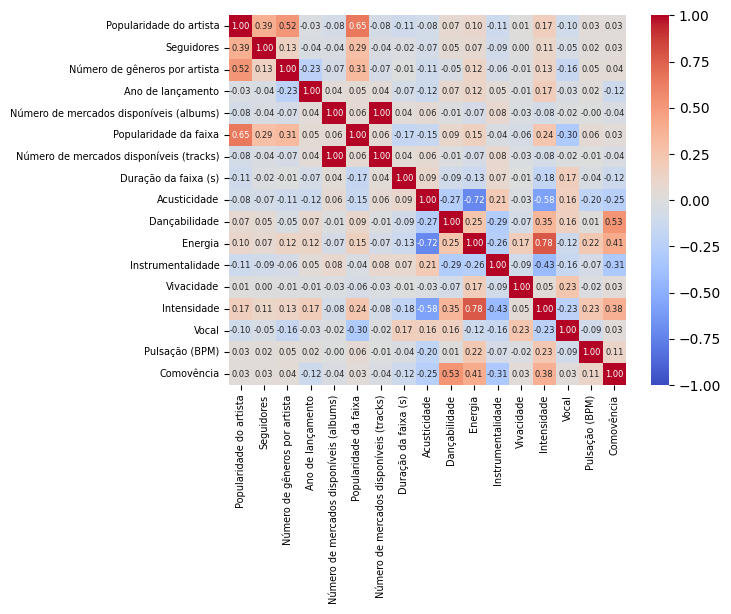

In [10]:
#Criação de data frame numérico para correlações
df_numbers = df_all_inners.select_dtypes(include="number")
df_numbers.drop(columns=["Número do disco", "Número de faixas", "Número da faixa", "Tom", "Modo", "Ritmo"], inplace=True)

#Criação do heatmap
heatmap = sns.heatmap(df_numbers.corr(),
            annot=True, fmt = '.2f', annot_kws={'size':6},
            vmin = -1,  vmax = 1,
            cmap = 'coolwarm')

heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=7)
heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=7)

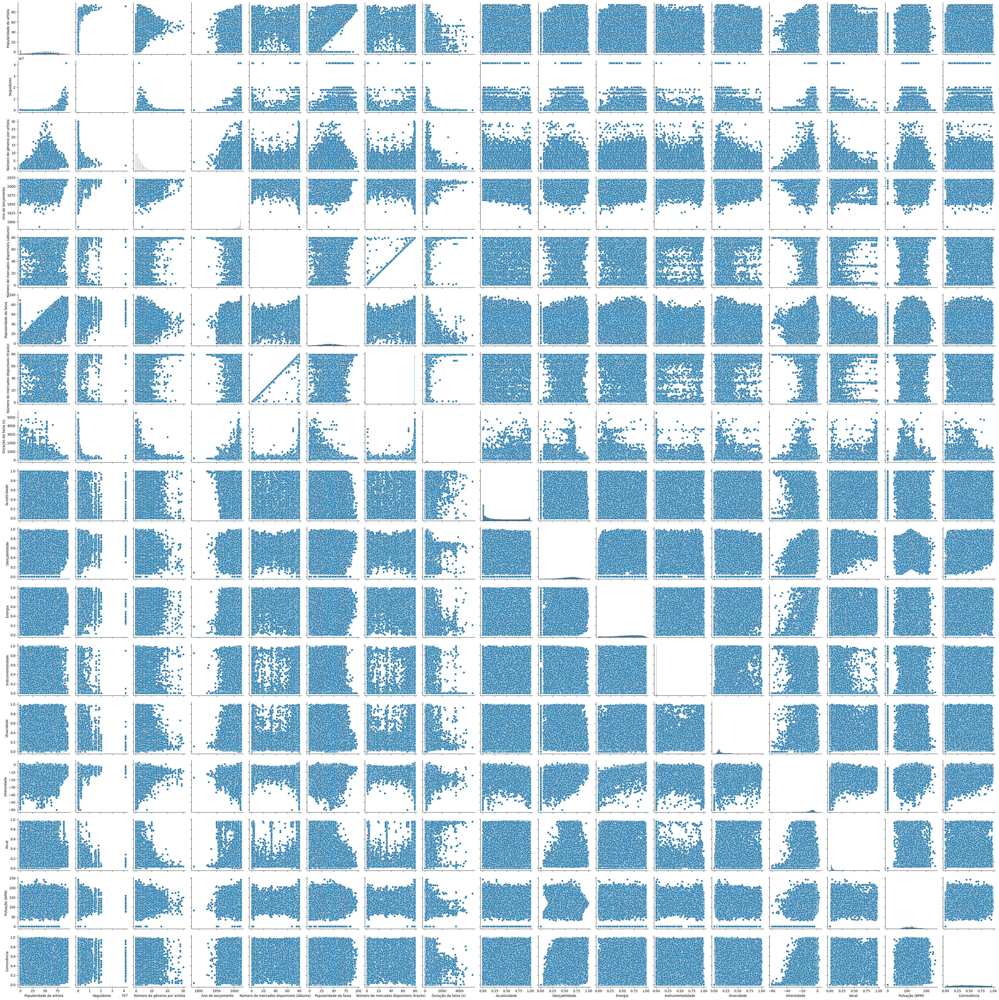

In [11]:
#Criação de pairplot
sns.pairplot(df_numbers)

C:\Users\scfel\AppData\Local\Temp\ipykernel_38000\915205881.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_albums_popularity, x="Popularidade da faixa", y="Nome do álbum", palette='viridis')


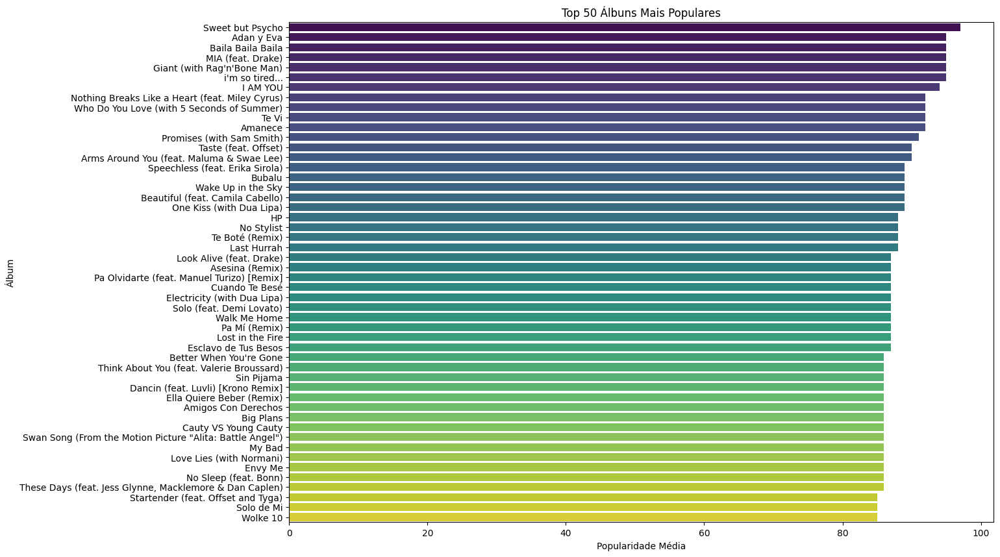

In [12]:
#União das colunas das base de dados
df_albums_tracks = pd.merge(df_albums, df_tracks, on="ID do álbum", how="inner", suffixes=("(albums)", "(tracks)"))

#Média de populariadade dos albuns 
df_albums_popularity = df_albums_tracks.groupby("Nome do álbum")["Popularidade da faixa"].mean().reset_index()
df_albums_popularity = df_albums_popularity.sort_values(by="Popularidade da faixa", ascending=False).head(50)

#Plotagem do gráfico de barras referente aos 50 albuns mais populares
plt.figure(figsize=(14, 10))
sns.barplot(data=df_albums_popularity, x="Popularidade da faixa", y="Nome do álbum", palette='viridis')
plt.xlabel('Popularidade Média')
plt.ylabel('Álbum')
plt.title('Top 50 Álbuns Mais Populares')
plt.show()

In [18]:
#Remoção de Outliers
df_numbers_filtered = df_numbers[(df_numbers['Popularidade do artista'] > 1) & (df_numbers['Popularidade da faixa'] < 100)]

#Criação de gráfico pop artista x pop faixa
px.scatter(df_numbers_filtered, x = "Popularidade do artista", y = "Popularidade da faixa")


Ao analisar o gráfico gerado, é visível que quanto maior a popularidade de um artista, maior a probabilidade de sua faixa ser popular, isto é, é recomendado que o cliente foque nos artistas mais populares.

In [30]:
#Remoção de Outliers
df_numbers_filtered = df_numbers[(df_numbers['Seguidores'] < 20000000) & (df_numbers['Seguidores'] > 500000)]

#Criação de gráfico seguidores x pop artista
px.scatter(df_numbers_filtered, x = "Seguidores", y = "Popularidade do artista")

Ao analisar o gráfico gerado, é visível que quanto maior a quantidade de seguidores de um artista, maior a probabilidade do artista ser popular, isto é, é recomendado que o cliente foque nos artistas com maiores quantidades de seguidores.

É interessante notar que, existem artistas que, mesmo com quantidades expressivas de seguidores (1 milhao), possuem popularidade medíocre. Quanto maior a quantidade de seguidores, menor a chance de um artistas ser pouco popular.

In [ ]:
#Remoção de Outliers
df_numbers_filtered = df_numbers[(df_numbers['Número de gêneros por artista'] >= 1) & (df_numbers['Número de gêneros por artista'] <=25)]

#Criação de gráfico num generos p artista x pop artista
px.scatter(df_numbers_filtered, x = "Número de gêneros por artista", y = "Popularidade do artista")

Quanto maior o número de gêneros por artista, mais limitada é sua popularidade. É interessante dizer que, se um artista tiver poucos números de gêneros trabalhados, não é garantido que ele seja muito ou pouco popular. 

Index(['Unnamed: 0', 'acusticidade', 'id_album', 'analysis_url', 'artists_id',
       'available_markets', 'country', 'dancabilidade', 'disc_number',
       'duracao_ms', 'energia', 'href', 'id_faixa', 'instrumentalidade', 'key',
       'liveness', 'volume', 'lyrics', 'mode', 'nome_faixa', 'playlist',
       'popularidade_faixa', 'preview_url', 'fala', 'tempo', 'time_signature',
       'track_href', 'track_name_prev', 'track_number', 'uri', 'valence',
       'type'],
      dtype='object')
Index(['Unnamed: 0', 'tipo_album', 'id_artista', 'available_markets',
       'external_urls', 'href', 'id_album', 'images', 'nome_album',
       'data_lancamento', 'release_date_precision', 'total_faixas', 'track_id',
       'track_name_prev', 'uri', 'type'],
      dtype='object')
Index(['Unnamed: 0', 'popularidade_artista', 'seguidores', 'generos',
       'id_artista', 'nome_artista', 'track_id', 'track_name_prev', 'type'],
      dtype='object')
Unnamed: 0              int64
acusticidade          flo

C:\Users\mathe\AppData\Local\Temp\ipykernel_12312\1696593159.py:65: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_album_popularidade, x='popularidade_faixa', y='nome_album', palette='viridis')


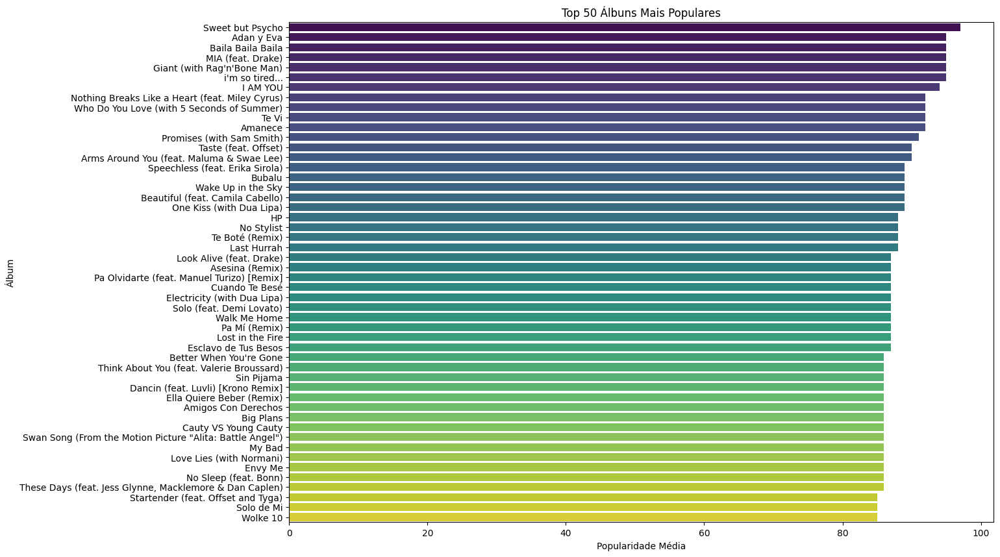

C:\Users\mathe\AppData\Local\Temp\ipykernel_12312\1696593159.py:77: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_artists_popularity, x='popularidade_faixa', y='nome_artista', palette='magma')


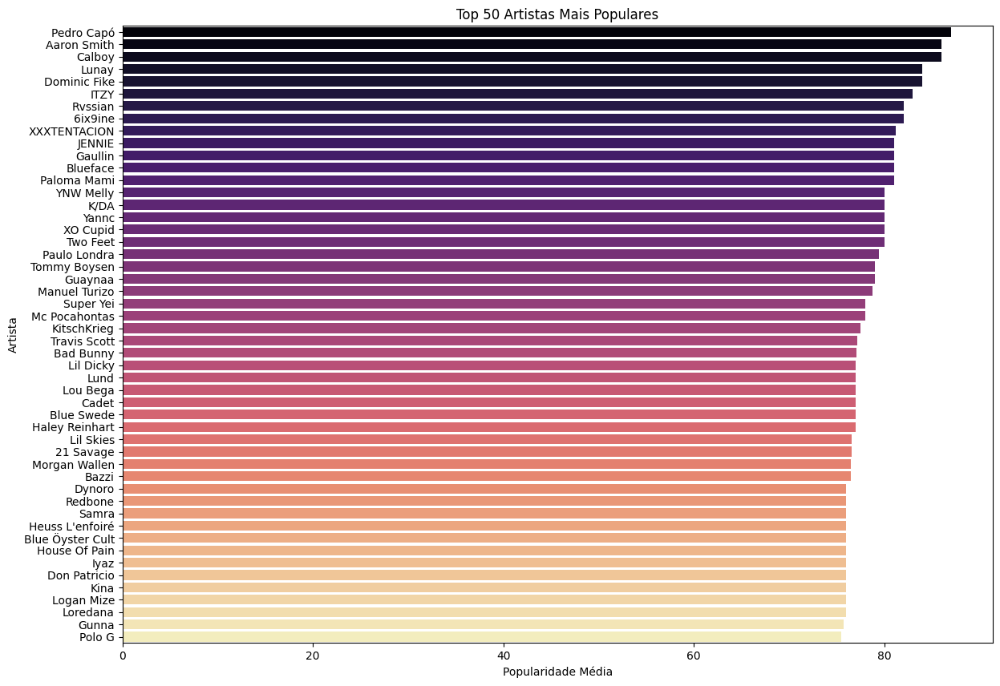

C:\Users\mathe\AppData\Local\Temp\ipykernel_12312\1696593159.py:102: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_artists_combined, x="Ranking Geral", y="nome_artista", palette='viridis')


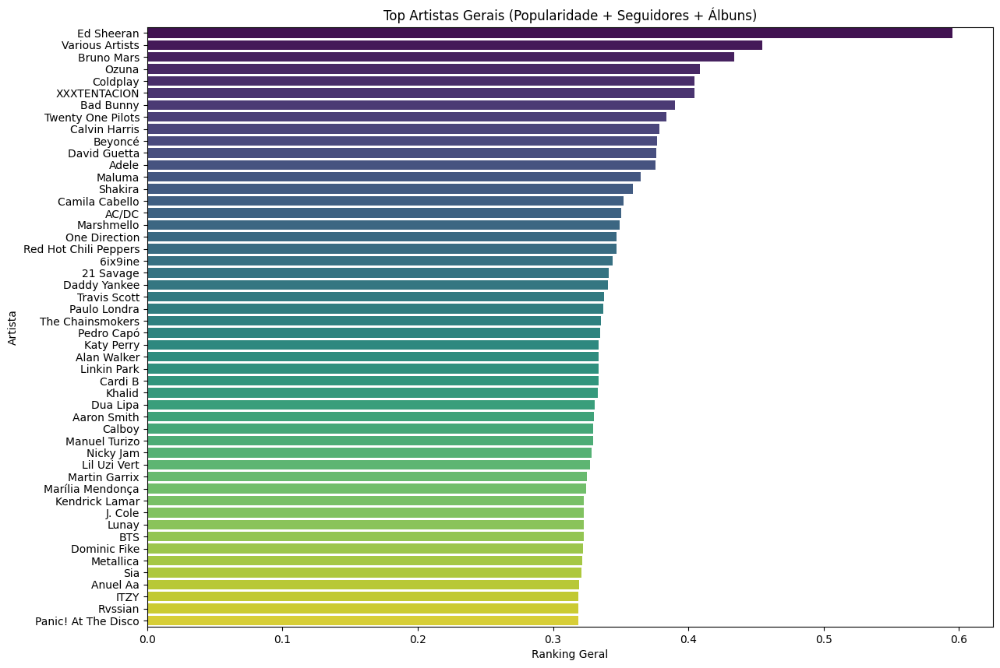

C:\Users\mathe\AppData\Local\Temp\ipykernel_12312\1696593159.py:116: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_artists_followers, x="seguidores", y="nome_artista", palette='plasma')


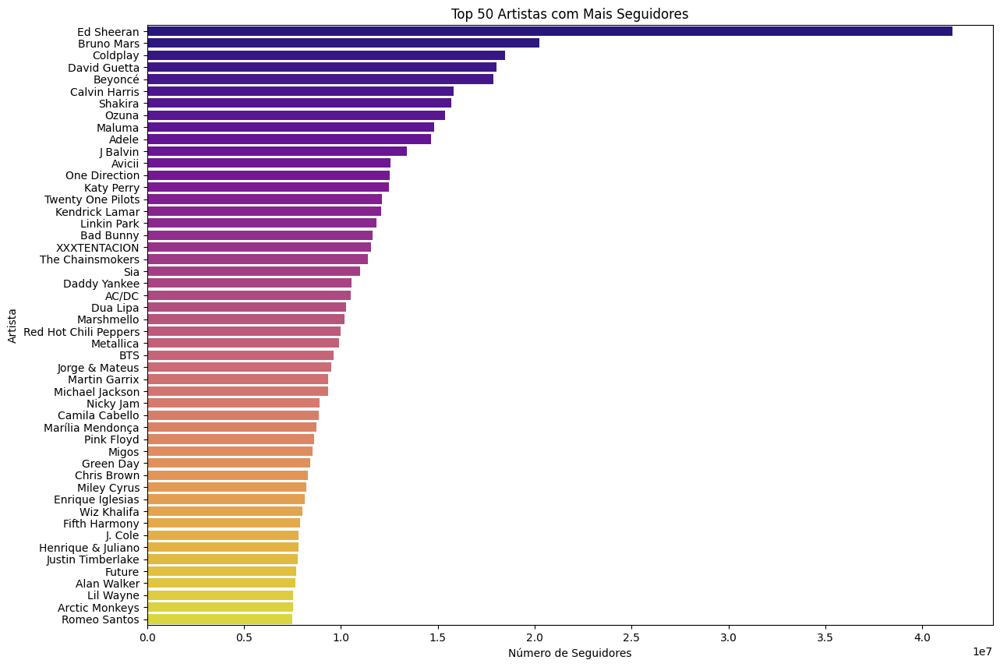

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Carregar os arquivos CSV
df_album = pd.read_csv("spotify_albums.csv")
df_artista = pd.read_csv("spotify_artists.csv")
df_tracks = pd.read_csv("spotify_tracks.csv")

# Renomear colunas para manter a consistência
df_tracks.rename(columns={
    'acousticness': 'acusticidade',
    'album_id': 'id_album',
    'danceability': 'dancabilidade',
    'duration_ms': 'duracao_ms',
    'energy': 'energia',
    'id': 'id_faixa',
    'instrumentalness': 'instrumentalidade',
    'loudness': 'volume',
    'name': 'nome_faixa',
    'popularity': 'popularidade_faixa',
    'speechiness': 'fala',
    'tempo': 'tempo'
}, inplace=True)

df_album.rename(columns={
    'album_type': 'tipo_album',
    'artist_id': 'id_artista',
    'id': 'id_album',
    'name': 'nome_album',
    'release_date': 'data_lancamento',
    'total_tracks': 'total_faixas'
}, inplace=True)

df_artista.rename(columns={
    'artist_popularity': 'popularidade_artista',
    'followers': 'seguidores',
    'genres': 'generos',
    'id': 'id_artista',
    'name': 'nome_artista'
}, inplace=True)

# Exibir informações sobre os DataFrames
print(df_tracks.columns)
print(df_album.columns)
print(df_artista.columns)
print(df_tracks.dtypes)
print(df_album.dtypes)
print(df_artista.dtypes)

# Mesclar os DataFrames
df_merged = pd.merge(df_tracks, df_album, on='id_album', how='inner')
df_artists_albums = pd.merge(df_artista, df_album, on='id_artista', how='inner')
df_all_inners = pd.merge(df_artists_albums, df_tracks, on='id_album', how='inner')

df_all_inners.drop(columns=['id_faixa_x'], inplace=True, errors='ignore')
df_all_inners.reset_index(drop=True, inplace=True)

# Calcular a popularidade média dos álbuns
df_album_popularidade = df_merged.groupby('nome_album')['popularidade_faixa'].mean().reset_index()
df_album_popularidade = df_album_popularidade.sort_values(by='popularidade_faixa', ascending=False).head(50)

# Visualização da popularidade dos álbuns
plt.figure(figsize=(14, 10))
sns.barplot(data=df_album_popularidade, x='popularidade_faixa', y='nome_album', palette='viridis')
plt.xlabel('Popularidade Média')
plt.ylabel('Álbum')
plt.title('Top 50 Álbuns Mais Populares')
plt.show()

# Calcular a popularidade média dos artistas
df_artists_popularity = df_all_inners.groupby('nome_artista')['popularidade_faixa'].mean().reset_index()
df_artists_popularity = df_artists_popularity.sort_values(by='popularidade_faixa', ascending=False).head(50)

# Visualização da popularidade dos artistas
plt.figure(figsize=(14, 10))
sns.barplot(data=df_artists_popularity, x='popularidade_faixa', y='nome_artista', palette='magma')
plt.xlabel('Popularidade Média')
plt.ylabel('Artista')
plt.title('Top 50 Artistas Mais Populares')
plt.show()

# Criando um ranking com pontuação combinada
df_artists_combined = df_all_inners.groupby("nome_artista").agg({
    "popularidade_faixa": "mean",  # Popularidade da faixa
    "seguidores": "mean",           # Seguidores
    "nome_album": "count"           # Contando álbuns lançados
}).reset_index()

# Normalizando os valores para combinar no ranking
df_artists_combined["Popularidade Normalizada"] = df_artists_combined["popularidade_faixa"] / df_artists_combined["popularidade_faixa"].max()
df_artists_combined["Seguidores Normalizados"] = df_artists_combined["seguidores"] / df_artists_combined["seguidores"].max()
df_artists_combined["Álbuns Normalizados"] = df_artists_combined["nome_album"] / df_artists_combined["nome_album"].max()

# Criando uma métrica combinada (exemplo: média dos três fatores)
df_artists_combined["Ranking Geral"] = (df_artists_combined["Popularidade Normalizada"] + df_artists_combined["Seguidores Normalizados"] + df_artists_combined["Álbuns Normalizados"]) / 3

# Ordenando e pegando os Top artistas
df_artists_combined = df_artists_combined.sort_values(by="Ranking Geral", ascending=False).head(50)

plt.figure(figsize=(14, 10))
sns.barplot(data=df_artists_combined, x="Ranking Geral", y="nome_artista", palette='viridis')
plt.xlabel('Ranking Geral')
plt.ylabel('Artista')
plt.title('Top Artistas Gerais (Popularidade + Seguidores + Álbuns)')
plt.show()

# Agrupar artistas pela média de seguidores
df_artists_followers = df_all_inners.groupby("nome_artista")["seguidores"].mean().reset_index()

# Ordenar os artistas pelos seguidores, pegando os 50 primeiros
df_artists_followers = df_artists_followers.sort_values(by="seguidores", ascending=False).head(50)

# Visualizar o ranking de artistas com mais seguidores
plt.figure(figsize=(14, 10))
sns.barplot(data=df_artists_followers, x="seguidores", y="nome_artista", palette='plasma')
plt.xlabel('Número de Seguidores')
plt.ylabel('Artista')
plt.title('Top 50 Artistas com Mais Seguidores')
plt.show()

